# **Stable Diffusion** 🎨
In the simplest form, Stable Diffusion is a text-to-image model. Give it a text prompt and it will return an image matching the text.

<img src='https://i0.wp.com/stable-diffusion-art.com/wp-content/uploads/2022/12/image-77.png?resize=50px'>

# Setup

In [1]:
import torch

In [2]:
if torch.cuda.is_available():
    # Shows the nVidia GPUs, if this system has any
    !nvidia-smi

Thu Mar 20 14:23:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
!pip install diffusers==0.11.1
!pip install transformers scipy ftfy accelerate
!pip install --upgrade huggingface-hub==0.26.2 transformers==4.46.1 tokenizers==0.20.1 diffusers==0.31.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 524.9/524.9 kB 13.0 MB/s eta 0:00:0000:01
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.31.0
    Uninstalling diffusers-0.31.0:
      Successfully uninstalled diffusers-0.31.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 43.0 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: diffusers
    Found existing installation: diffusers 0.11.1
    Uninstalling diffusers-0.11.1:
      Successfully uninstalled diffusers-0.11.1


StableDiffusionPipeline is an end-to-end inference pipeline that you can use to generate images from text with just a few lines of code.

First, we load the pre-trained weights of all components of the model. In this notebook we use Stable Diffusion version 1.4

In [5]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

if torch.cuda.is_available():
    device=torch.device("cuda")
elif torch.backends.mps.is_available():
    device=torch.device("mps")

pipe = pipe.to(device)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

# Exercise 1: Prompt Engineering
Run the below cell to verify the Stable Diffusion Pipeline is set up and running. Confirm you see an image of an astronaut riding a horse!

Change the prompt and run again. Here are some best practices on how to structure your AI art prompt: https://letsenhance.io/blog/article/ai-text-prompt-guide

<img src='https://letsenhance.io/blog/content/images/2024/08/ai-image-prompts-6.png'>

  0%|          | 0/50 [00:00<?, ?it/s]

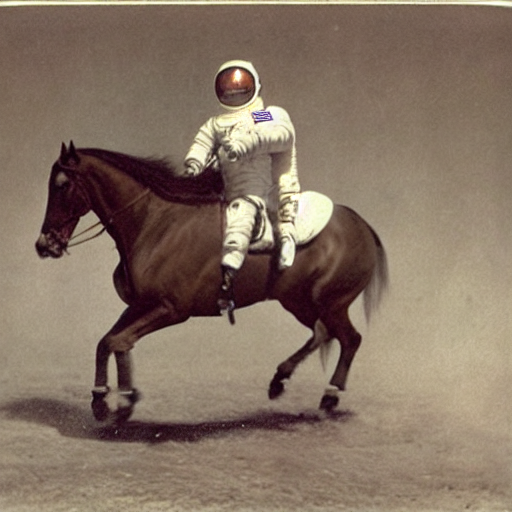

In [6]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]  # image here is in PIL format

# Now to display an image you can either save it such as:
image.save(f"astronaut_rides_horse.png")

# or you can directly display an image if you're in a google colab or kaggle notebook
image

## *Negative Prompts*
Negative prompts are used to specify things in an image that you don’t want to see during creation. By describing what you want to eliminate in your negative prompt, you can ask Stable Diffusion to exclude certain elements, styles, or environments when creating images.

Negative prompts can be used to remove unwanted objects, people, or animals or to change an image’s background or environment completely. They can also be used to emphasize your original prompt by specifying keywords that mean the opposite of what you added in the main prompt. Negative prompts you may use on Stable Diffusion are as follows:

**<u>Exercise:</u> Try changing the values for `negative_prompt` and see how it changes the image.**

  0%|          | 0/50 [00:00<?, ?it/s]

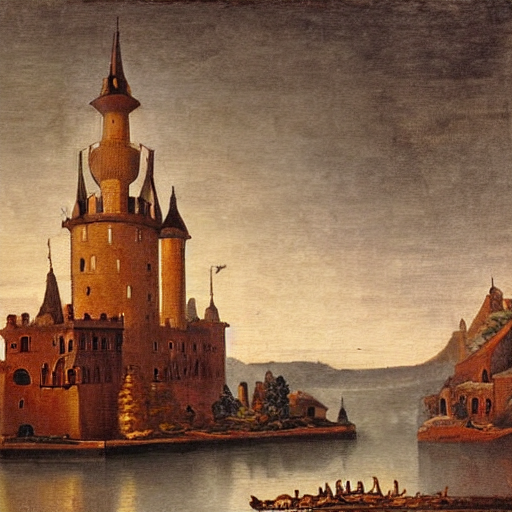

In [8]:
prompt = "landscape painting of a grand castle from the middle ages"
negative_prompt = "grass"

image = pipe(prompt, negative_prompt=negative_prompt).images[0]

# Now to display an image you can do either save it such as:
image.save(f"castle_no_trees.png")
image

# **Exercise 2: Seed and Steps**
## *Fixing the random seed*
Running the same code multiple times will give you a different image every time. If you want to get the same image, you can pass a random seed to the pipeline by using `manual_seed(n)` where `n` is any number you choose. Every time you use the same seed you'll have the same image result.

**<u>Exercise:</u> Try several different seed values below and see what you get.**

  0%|          | 0/50 [00:00<?, ?it/s]

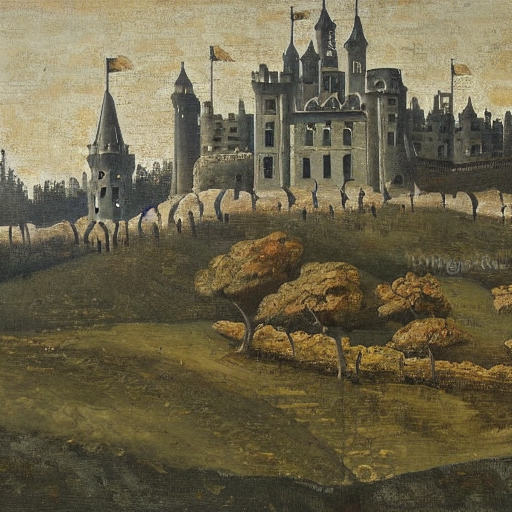

In [10]:
generator = torch.Generator(device).manual_seed(1024)

image = pipe(prompt, generator=generator).images[0]

image

## *Changing (Denoising) Diffusion steps*
Stable Diffusion starts with an image that consists of random noise. Then it continously denoises this image over and over again to steer it to the direction of your prompt. **Inference steps** controls how many steps will be taken during this process.

You can change the number of inference steps using the `num_inference_steps` argument. In general, results are better the more steps you use. However, the higher the number does not necessarily mean the better the quality, because after a certain number of steps, certain models in certain configurations will start introducing details that you might not like. Moreover, the higher the steps, the longer it takes to process.

**<u>Exercise:</u> Observe what happens to the image when you change `num_inference_steps` to 5, 15, 25, 50, etc.**

  0%|          | 0/50 [00:00<?, ?it/s]

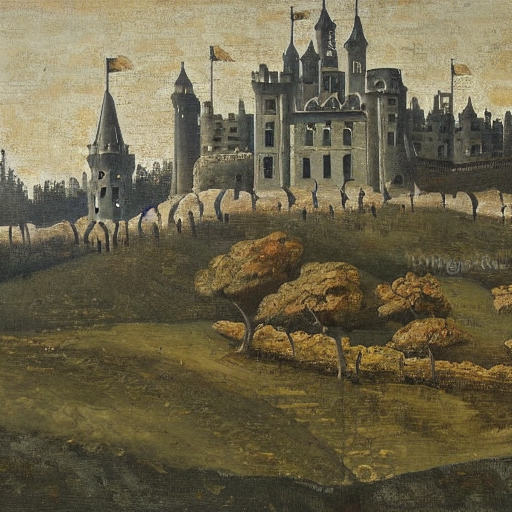

In [13]:
generator = torch.Generator(device).manual_seed(1024)

image = pipe(prompt, num_inference_steps=50, generator=generator).images[0]

image

# **Exercise 3: Modifying the number and size of images generated**
## *Generating multiple images in a grid*
To generate multiple images for the same prompt, we simply use a list with the same prompt repeated several times. We'll send the list to the pipeline instead of the string we used before.

Let's first write a helper function to display a grid of images. Just run the following cell to create the `image_grid` function.

In [14]:
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Now, we can generate a grid image once having run the pipeline with a list of 3 prompts.

  0%|          | 0/50 [00:00<?, ?it/s]

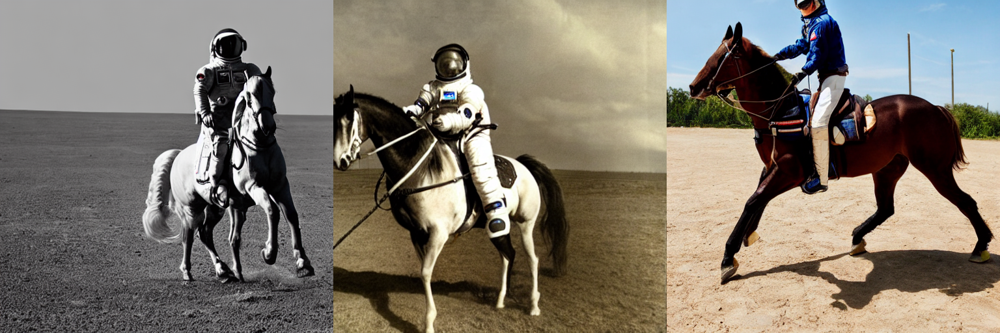

In [15]:
num_images = 3
prompt = ["a photograph of an astronaut riding a horse"] * num_images

images = pipe(prompt).images

grid = image_grid(images, rows=1, cols=3)
grid

And here's how to generate a grid of `n × m` images.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

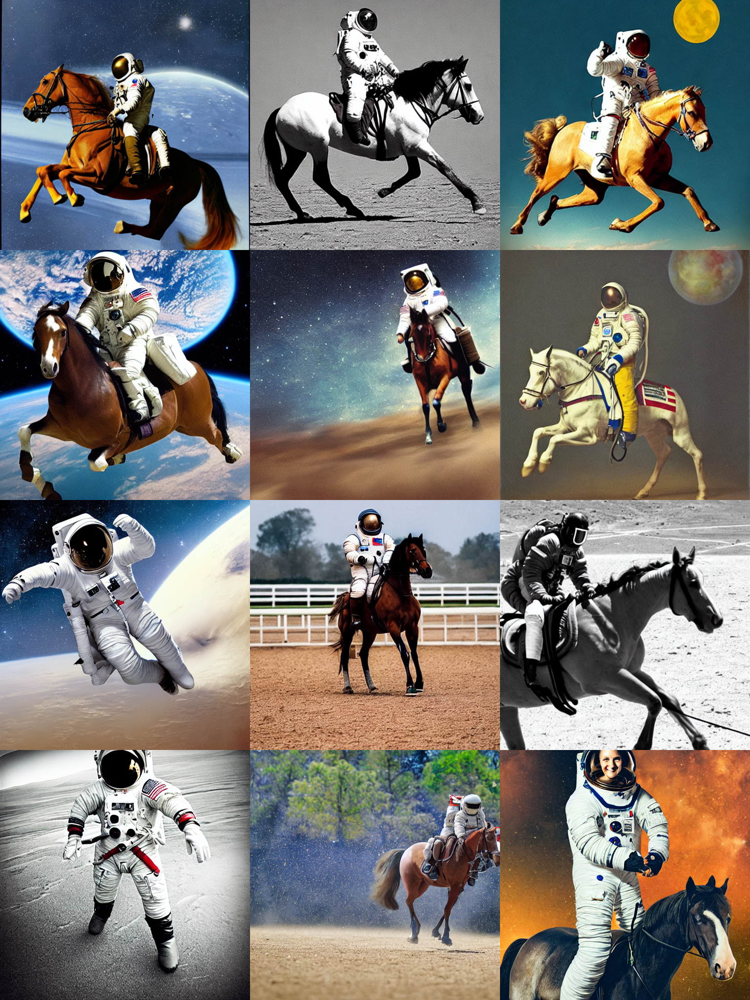

In [16]:
num_cols = 3
num_rows = 4

prompt = ["a photograph of an astronaut riding a horse"] * num_cols

all_images = []
for i in range(num_rows):
  images = pipe(prompt).images
  all_images.extend(images)

grid = image_grid(all_images, rows=num_rows, cols=num_cols)
grid